# City of Toronto Bicycle Collisions Data

This dataset provides detailed information on bicycle collisions that have occurred within the City of Toronto. It includes data on the location, time, and circumstances of each incident, offering valuable insights into patterns and trends related to bicycle safety. By analyzing this data, we can better understand the factors contributing to bicycle collisions and identify areas where improvements in infrastructure or safety measures may be needed. Whether for research, policy-making, or public awareness, this data serves as a vital tool for improving urban cycling conditions and reducing accidents.

## Setup Notebook

In [1]:
# Import 3rd party libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pylab as plt
import geopandas as gpd
import matplotlib.pyplot as plt
import folium
from IPython.display import display
import geopandas as gpd
from shapely.geometry import Point

# Configure Notebook
%matplotlib inline
plt.style.use('fivethirtyeight')
sns.set_context("notebook")
import warnings
warnings.filterwarnings('ignore')

/Users/aaliyashaikh/Library/Python/3.8/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


## Import GeoJson Data

To begin analyzing bicycle collision data, we first need to load the dataset. The data is stored in GeoJSON format, which contains geographical information that can be processed using a GeoDataFrame in the geopandas library. Below, we import the dataset and display the first few rows to get an overview of the data structure:

In [2]:
# Load the dataset from the specified path and read it as a GeoDataFrame
# The dataset contains traffic collision data in GeoJSON format, which includes geospatial information (e.g., location of collisions)
collision_data = gpd.read_file('../../data_files/Traffic_Collisions_Open_Data_-6024052409346627848.geojson')

# Display the first few rows of the dataset to get an overview of its structure and contents
collision_data.head()


,OBJECTID,EVENT_UNIQUE_ID,OCC_DATE,OCC_MONTH,OCC_DOW,OCC_YEAR,OCC_HOUR,DIVISION,FATALITIES,INJURY_COLLISIONS,...,HOOD_158,NEIGHBOURHOOD_158,LONG_WGS84,LAT_WGS84,AUTOMOBILE,MOTORCYCLE,PASSENGER,BICYCLE,PEDESTRIAN,geometry
0,1,GO-20148000005,"Wed, 01 Jan 2014 05:00:00 GMT",January,Wednesday,2014,13,D23,0,NO,...,006,Kingsview Village-The Westway (6),-79.558639,43.694246,YES,NO,NO,NO,NO,POINT (-79.55864 43.69425)
1,2,GO-20148000085,"Wed, 01 Jan 2014 05:00:00 GMT",January,Wednesday,2014,19,D42,0,NO,...,128,Agincourt South-Malvern West (128),-79.281506,43.784746,YES,NO,NO,NO,NO,POINT (-79.28151 43.78475)
2,3,GO-20141260499,"Wed, 01 Jan 2014 05:00:00 GMT",January,Wednesday,2014,2,NSA,0,YES,...,NSA,NSA,0.000000,0.000000,YES,NO,NO,NO,NO,POINT (0.00000 0.00000)
3,4,GO-20141260663,"Wed, 01 Jan 2014 05:00:00 GMT",January,Wednesday,2014,3,NSA,0,NO,...,NSA,NSA,0.000000,0.000000,YES,NO,NO,NO,NO,POINT (0.00000 0.00000)
4,5,GO-20141261162,"Wed, 01 Jan 2014 05:00:00 GMT",January,Wednesday,2014,5,NSA,0,YES,...,NSA,NSA,0.000000,0.000000,YES,NO,NO,NO,NO,POINT (0.00000 0.00000)


We can see that there are a lot of collisions in the City of Toronto. Now let's analyze that data in the dataset. 

## Data Analysis

Let's explore the features within the collision dataset!

In [3]:
# Check the number of columns and rows
collision_data.shape

(704704, 22)

In [4]:
# Check the columns in DataFrame
collision_data.columns

Index(['OBJECTID', 'EVENT_UNIQUE_ID', 'OCC_DATE', 'OCC_MONTH', 'OCC_DOW',
       'OCC_YEAR', 'OCC_HOUR', 'DIVISION', 'FATALITIES', 'INJURY_COLLISIONS',
       'FTR_COLLISIONS', 'PD_COLLISIONS', 'HOOD_158', 'NEIGHBOURHOOD_158',
       'LONG_WGS84', 'LAT_WGS84', 'AUTOMOBILE', 'MOTORCYCLE', 'PASSENGER',
       'BICYCLE', 'PEDESTRIAN', 'geometry'],
      dtype='object')

Based on the Toronto Police Service's Traffic Collisions Open Data, here is a description of each column in the dataset:

- OBJECTID: A unique identifier for each collision record.
- EVENT_UNIQUE_ID: A unique code assigned to each specific event.
- OCC_DATE: The date and time of the collision occurrence.
- OCC_MONTH: The month in which the collision occurred.
- OCC_DOW: The day of the week on which the collision happened.
- OCC_YEAR: The year in which the collision occurred.
- OCC_HOUR: The hour of the day (24-hour format) when the collision took place.
- DIVISION: The division code where the incident was recorded.
- FATALITIES: The number of fatalities resulting from the collision.
- INJURY_COLLISIONS: Indicates whether the collision involved injuries (e.g., "YES" or "NO").
- FTR_COLLISIONS: Indicates whether the collision was a "Fail to Remain" incident.
- PD_COLLISIONS: Indicates whether the collision involved property damage.
- HOOD_158: Numeric code representing the neighborhood where the collision occurred.
- NEIGHBOURHOOD_158: The name of the neighborhood and its associated number.
- LONG_WGS84: Longitude of the collision location (in WGS84 coordinate system).
- LAT_WGS84: Latitude of the collision location (in WGS84 coordinate system).
- AUTOMOBILE: Indicates if an automobile was involved in the collision (e.g., "YES" or "NO").
- MOTORCYCLE: Indicates if a motorcycle was involved in the collision.
- PASSENGER: Indicates if a passenger vehicle was involved in the collision.
- BICYCLE: Indicates if a bicycle was involved in the collision.
- PEDESTRIAN: Indicates if a pedestrian was involved in the collision.
- geometry: A spatial coordinate (likely projected coordinate system) for mapping the location.


In [5]:
# Check data types per column
print(collision_data.dtypes)

OBJECTID                int64
EVENT_UNIQUE_ID        object
OCC_DATE               object
OCC_MONTH              object
OCC_DOW                object
OCC_YEAR               object
OCC_HOUR               object
DIVISION               object
FATALITIES              int64
INJURY_COLLISIONS      object
FTR_COLLISIONS         object
PD_COLLISIONS          object
HOOD_158               object
NEIGHBOURHOOD_158      object
LONG_WGS84            float64
LAT_WGS84             float64
AUTOMOBILE             object
MOTORCYCLE             object
PASSENGER              object
BICYCLE                object
PEDESTRIAN             object
geometry             geometry
dtype: object


In [6]:
# Check numerical statistics for each column
collision_data.describe()

,OBJECTID,FATALITIES,LONG_WGS84,LAT_WGS84
count,704704.000000,704704.000000,704704.000000,704704.000000
mean,352352.500000,0.000873,-66.342691,36.528215
std,203430.666387,0.030053,29.423231,16.200397
min,1.000000,0.000000,-79.639247,0.000000
25%,176176.750000,0.000000,-79.444829,43.644346
50%,352352.500000,0.000000,-79.370469,43.692500
75%,528528.250000,0.000000,-79.258521,43.751480
max,704704.000000,3.000000,0.000000,43.853164


In this step, we are dropping all columns from the dataset except for those that are directly relevant to bicycle collisions. This is done to streamline the data and focus specifically on the information that pertains to bicycle-related incidents, which allows for more targeted analysis. By removing unnecessary columns, we reduce complexity and ensure that subsequent steps in data processing and analysis are more efficient and manageable.


In [7]:
# Drop columns
collision_data = collision_data.drop(columns=[
    'OBJECTID',               # Unique identifier, not informative for analysis
    'EVENT_UNIQUE_ID',        # Another unique identifier, redundant
    'HOOD_158',               # Numeric code for neighborhoods, redundant with neighborhood name
    'INJURY_COLLISIONS',      # Specific collision categories, may not fit broader analysis
    'NEIGHBOURHOOD_158',      # Redundant if detailed spatial analysis isn't required
    'OCC_MONTH',              # Month derivable from OCC_DATE
    'OCC_YEAR',               # Year derivable from OCC_DATE
    'OCC_DOW',                # Day of week derivable from OCC_DATE
    'DIVISION',               # Redundant for neighborhood-focused analysis
    'PASSENGER',              # Overlaps with automobile classification
    'AUTOMOBILE',             # May be less relevant if focusing on broader vehicle data
    'FATALITIES',             # May not fit broad collision trends
    'FTR_COLLISIONS',         # Specific collision subcategories
    'PD_COLLISIONS',          # Specific collision subcategories
    'MOTORCYCLE',             # May not fit focus of general collision analysis
    'PEDESTRIAN',             # May not fit focus of general collision analysis
], errors='ignore')

# Rename columns in the GeoDataFrame
collision_data.rename(columns={
    'OCC_DATE': 'DATE',            # Rename to better indicate the data's purpose
    'LONG_WGS84': 'LONGITUDE',     # Simplify and clarify the name
    'LAT_WGS84': 'LATITUDE',       # Simplify and clarify the name
    'OCC_HOUR': 'HOUR'             # Rename for consistency
}, inplace=True)

# Check if columns are removed and remaining columns have been renamed
collision_data.columns


Index(['DATE', 'HOUR', 'LONGITUDE', 'LATITUDE', 'BICYCLE', 'geometry'], dtype='object')

## Data Cleaning

Data cleaning for the collision dataset ensures:

- Accuracy: Removes errors and inconsistencies.
- Efficiency: Streamlines the dataset for quicker and easier analysis.
- Reliability: Produces trustworthy insights and recommendations.
- Focus: Tailors the data for the specific analysis of collision patterns and trends.

This code below is used to convert the 'collision_date' column in the dataset into a datetime format. Converting the column ensures that the dates are in a standardized format that allows for easier manipulation and analysis (e.g., filtering by date, time-based grouping). The column name 'DATE' should be replaced with the actual name of the date column in your dataset if different. After the conversion, we verify the results by displaying the first few rows of the dataset to confirm the transformation.

Given the large size of the traffic collision dataset, it would be inefficient to work with the entire dataset when we're only interested in data from 2014 to 2024. To streamline our analysis, we will filter the dataset to focus solely on the relevant records from these years. This approach reduces the amount of data we're working with and helps optimize processing time. 

In [8]:
# Convert the 'collision_date' column to datetime (replace 'collision_date' with the actual column name)
collision_data['DATE'] = pd.to_datetime(collision_data['DATE'])

# Filter data from 2014 to 2024 and drop all other entries
collision_data_filtered = collision_data[(collision_data['DATE'].dt.year >= 2014) & 
                                         (collision_data['DATE'].dt.year <= 2024)]

# Verify the results by displaying the first few rows
collision_data_filtered.head()


,DATE,HOUR,LONGITUDE,LATITUDE,BICYCLE,geometry
0,2014-01-01 05:00:00,13,-79.558639,43.694246,NO,POINT (-79.55864 43.69425)
1,2014-01-01 05:00:00,19,-79.281506,43.784746,NO,POINT (-79.28151 43.78475)
2,2014-01-01 05:00:00,2,0.000000,0.000000,NO,POINT (0.00000 0.00000)
3,2014-01-01 05:00:00,3,0.000000,0.000000,NO,POINT (0.00000 0.00000)
4,2014-01-01 05:00:00,5,0.000000,0.000000,NO,POINT (0.00000 0.00000)


Before proceeding with any analysis, it's important to check the dataset for missing values. Missing or incomplete data can lead to inaccurate results or errors in processing. The following code will help us identify if there are any missing values in the traffic collision dataset and show the number of missing entries for each column:

In [9]:
# Check for missing values
print(collision_data_filtered.isnull().sum())

DATE         0
HOUR         0
LONGITUDE    0
LATITUDE     0
BICYCLE      4
geometry     0
dtype: int64


Oh no! There are 4 missing 'BICYCLE' enteries. This code removes any rows from the dataset that contain missing (NaN) values. By calling dropna(), we ensure that only complete records are retained for analysis, which helps maintain the integrity of the dataset. After cleaning the data, we verify the result by checking for any remaining missing values using isnull().sum(). This step ensures that no NaN values persist in the cleaned dataset, allowing for more reliable analysis moving forward.

In [10]:
# Drop rows with any NaN values
collision_data_filtered = collision_data_filtered.dropna()

# Verify the result by checking the number of missing values after dropping NaNs
print(collision_data_filtered.isnull().sum())

DATE         0
HOUR         0
LONGITUDE    0
LATITUDE     0
BICYCLE      0
geometry     0
dtype: int64


Although we've removed all null (NaN) values, the dataset still contains placeholder values like '0', 'No', or 'N/R', which provide no useful information and are effectively equivalent to missing data. The following code will remove all rows where any column contains these values, ensuring that the dataset only includes meaningful entries for further analysis.

In [11]:
# Drop rows where LONGITUDE or LATITUDE values are 0 or BICYCLE is 'NO' or 'N/R'
collision_data_bicycles = collision_data_filtered[
    (collision_data_filtered['LONGITUDE'] != 0) & 
    (collision_data_filtered['LATITUDE'] != 0) & 
    (collision_data_filtered['BICYCLE'] != 'NO') &
    (collision_data_filtered['BICYCLE'] != 'N/R')
]

# Verify the results by displaying the first few rows
collision_data_bicycles.head()

,DATE,HOUR,LONGITUDE,LATITUDE,BICYCLE,geometry
89,2014-01-02 05:00:00,18,-79.380272,43.648644,YES,POINT (-79.38027 43.64864)
351,2014-01-03 05:00:00,11,-79.399845,43.652539,YES,POINT (-79.39984 43.65254)
1857,2014-01-09 05:00:00,13,-79.405167,43.656966,YES,POINT (-79.40517 43.65697)
1891,2014-01-09 05:00:00,5,-79.480613,43.665578,YES,POINT (-79.48061 43.66558)
2271,2014-01-12 05:00:00,22,-79.377892,43.649143,YES,POINT (-79.37789 43.64914)


Now that we have dropped all unnesecesary data, to get an overview of the size of the dataset, it's useful to check the number of rows and columns it contains. The following code will display the shape of the traffic collision dataset, which will tell us how many entries (rows) and features (columns) are present:

In [12]:
collision_data_bicycles.shape

(10402, 6)

Initially, I planned to remove duplicates as part of the data cleaning process. However, it's not advisable to drop duplicates in this dataset because multiple collisions can occur at the same time or at the same geographical coordinates (longitude and latitude). To ensure the integrity of the data, I chose not to remove any duplicates. I would typically  also remove outliers using the Interquartile Range method. However, outliers in traffic collision datasets often represent rare but significant events that can provide valuable insights. Removing these data points without careful consideration might undermine the depth and accuracy of the analysis, potentially overlooking critical patterns or impactful incidents.

In [13]:
# View DataFrame
collision_data_bicycles.tail()

,DATE,HOUR,LONGITUDE,LATITUDE,BICYCLE,geometry
704570,2024-09-30 05:00:00,18,-79.423258,43.662508,YES,POINT (-79.42326 43.66251)
704621,2024-09-30 05:00:00,10,-79.409940,43.645990,YES,POINT (-79.40994 43.64599)
704634,2024-09-30 05:00:00,8,-79.297271,43.825952,YES,POINT (-79.29727 43.82595)
704644,2024-09-30 05:00:00,14,-79.378334,43.666282,YES,POINT (-79.37833 43.66628)
704654,2024-09-30 05:00:00,20,-79.375753,43.669662,YES,POINT (-79.37575 43.66966)


## Visualization of Filtered Collision Dataset

This code creates an interactive map visualizing bicycle collision locations in Toronto. The map is generated using the Folium library, which allows us to display geospatial data in a user-friendly format. The code first defines the coordinates for Toronto, then creates a map centered on those coordinates. Each collision from the collision_data_bicycles dataset is added to the map as a blue circle marker, representing the latitude and longitude of each incident. A layer control panel is also added, allowing for further customization of the map view. Finally, the map is displayed for exploration.

In [14]:
# Define Toronto's latitude and longitude
toronto_coords = [43.65107, -79.347015]

# Create a folium map centered on Toronto
map = folium.Map(location=toronto_coords, zoom_start=12)

# Define a color map for years (you can adjust the color palette as needed)
year_colors = {
    2014: 'cyan',
    2015: 'blue',
    2016: 'green',
    2017: 'red',
    2018: 'purple',
    2019: 'orange',
    2020: 'yellow',
    2021: 'pink',
    2022: 'black',
    2023: 'gray',
    2024: 'brown'
}

# Add each collision from collision_data_bicycles to the map
for _, row in collision_data_bicycles.iterrows():
    # Extract the year from the 'DATE' column
    year = pd.to_datetime(row['DATE']).year  # Convert 'DATE' to datetime and extract the year
    
    # Get the color corresponding to the year
    color = year_colors.get(year)  

    folium.CircleMarker(
      location=[row['LATITUDE'], row['LONGITUDE']],  # Set the marker's location
      radius=1,  # Marker size
      color=color,  # Border color based on the year
      fill=True,
      fill_color=color,  # Fill color based on the year
      fill_opacity=0.6  # Transparency
    ).add_to(map)

# Add a layer control to toggle map layers if needed
folium.LayerControl().add_to(map)

# Display the interactive map
map



Legend:
The markers on the map are color-coded by the year of the collision:

- Blue: 2015
- Green: 2016
- Red: 2017
- Purple: 2018
- Orange: 2019
- Yellow: 2020
- Pink: 2021
- Black: 2022
- Gray: 2023

This will help you visually differentiate collisions based on the year of occurrence.

## Exploratory Data Analysis of Collisions Data from 2019 to 2023

### Extracted Time Features from Collision Data

After converting the `DATE` column to a proper datetime format, we extracted several time-based attributes to analyze collision patterns more effectively. The following features were derived:

1. **Year**: The year in which the collision occurred.
2. **Month**: The month of the collision (1 = January, 12 = December).
3. **Day of the Week**: The name of the day (e.g., Monday, Tuesday).
4. **Hour**: The hour of the day when the collision occurred (0-23).

These features allow for temporal analysis of the data, such as identifying trends over years, seasonal patterns, or the most common days and hours for collisions. For example, examining collisions by the day of the week can help identify whether weekdays or weekends experience more accidents, while the hour attribute can reveal peak traffic or high-risk hours.


In [15]:
# Ensure the DATE column is in datetime format
collision_data_bicycles['DATE'] = pd.to_datetime(collision_data_bicycles['DATE'], errors='coerce')

# Extract year, month, and day of the week
collision_data_bicycles['YEAR'] = collision_data_bicycles['DATE'].dt.year
collision_data_bicycles['MONTH'] = collision_data_bicycles['DATE'].dt.month
collision_data_bicycles['DAY OF WEEK'] = collision_data_bicycles['DATE'].dt.day_name()

# Drop the time portion in the DATE column
collision_data_bicycles['DATE'] = collision_data_bicycles['DATE'].dt.date

# Reorder the columns
ordered_columns = ['DATE', 'HOUR', 'DAY OF WEEK', 'MONTH', 'YEAR', 'BICYCLE', 'LONGITUDE', 'LATITUDE', 'geometry']
collision_data_bicycles = collision_data_bicycles[ordered_columns]

# Display the filtered DataFrame
collision_data_bicycles.head()

,DATE,HOUR,DAY OF WEEK,MONTH,YEAR,BICYCLE,LONGITUDE,LATITUDE,geometry
89,2014-01-02,18,Thursday,1,2014,YES,-79.380272,43.648644,POINT (-79.38027 43.64864)
351,2014-01-03,11,Friday,1,2014,YES,-79.399845,43.652539,POINT (-79.39984 43.65254)
1857,2014-01-09,13,Thursday,1,2014,YES,-79.405167,43.656966,POINT (-79.40517 43.65697)
1891,2014-01-09,5,Thursday,1,2014,YES,-79.480613,43.665578,POINT (-79.48061 43.66558)
2271,2014-01-12,22,Sunday,1,2014,YES,-79.377892,43.649143,POINT (-79.37789 43.64914)


We will now change the order of the columns to a more logical sequence. 

This code saves the cleaned and filtered dataset containing only bicycle-related collisions into a new GeoJSON file. By exporting the data to GeoJSON format, we can easily share, visualize, or analyze the data in GIS software or other compatible tools. The following code specifies the output file path and uses the to_file() method to save the data:

In [16]:
# Convert the 'DATE' column to string format (YYYY-MM-DD)
collision_data_bicycles['DATE'] = collision_data_bicycles['DATE'].astype(str)

# Export the GeoDataFrame to GeoJSON
output_path = "../Clean Data/collision_data.geojson"
collision_data_bicycles.to_file(output_path, driver="GeoJSON")

### Yearly Collision Trends Analysis

The following plot visualizes the number of bicycle collisions in Toronto from 2014 to 2023. Using a bar plot, we can observe the yearly distribution of bicycle-related accidents. This graph highlights trends in collision frequency over time, which can provide insights into changes in bicycle safety, traffic patterns, or the impact of any safety initiatives implemented during this period. By analyzing the data in this way, we can better understand the fluctuations in bicycle collision rates and identify potential years of concern for targeted interventions or further investigation.

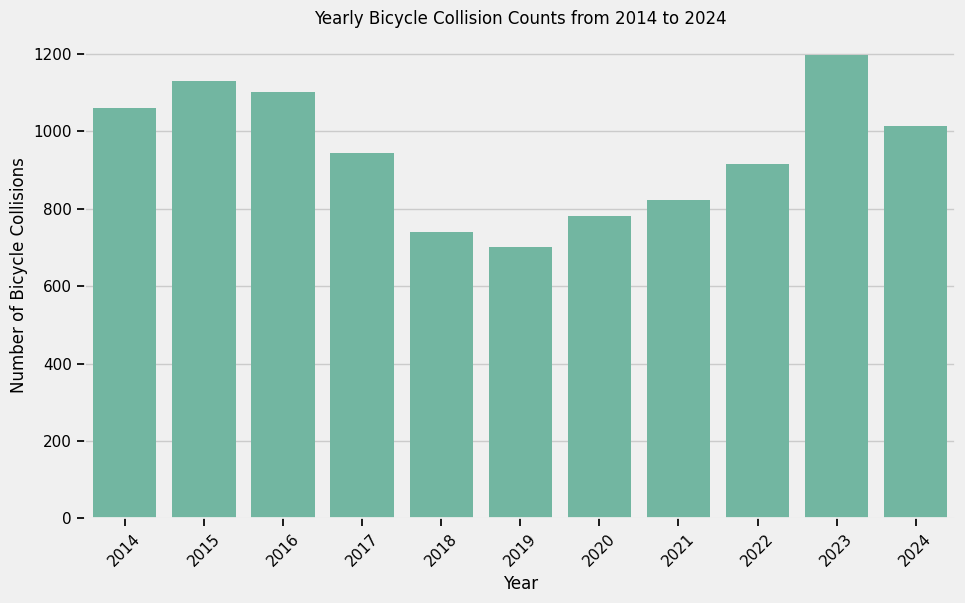

In [17]:
# Plot collisions per year from 2014 to 2023 for bicycles only
plt.figure(figsize=(10, 6))

# Set a more attractive color palette 
sns.set_palette("Set2")

# Create the count plot for bicycle collisions by year
sns.countplot(x='YEAR', data=collision_data_bicycles)

# Add titles and labels
plt.title('Yearly Bicycle Collision Counts from 2014 to 2024')
plt.xlabel('Year')
plt.ylabel('Number of Bicycle Collisions')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Show the plot
plt.show()

### Relationship between Month and Year

The following line plot visualizes the trends in bicycle collisions over time, broken down by month, for the years 2014 to 2023. Each point represents the number of bicycle collisions that occurred in a specific month, with different lines corresponding to each year. The plot uses a custom color palette to distinguish between years, making it easy to identify patterns or changes in collision rates across the years. The x-axis displays the months, while the y-axis shows the number of collisions, allowing for an in-depth analysis of temporal trends in bicycle safety. This visualization provides valuable insights into how monthly collision rates have evolved over the past decade.

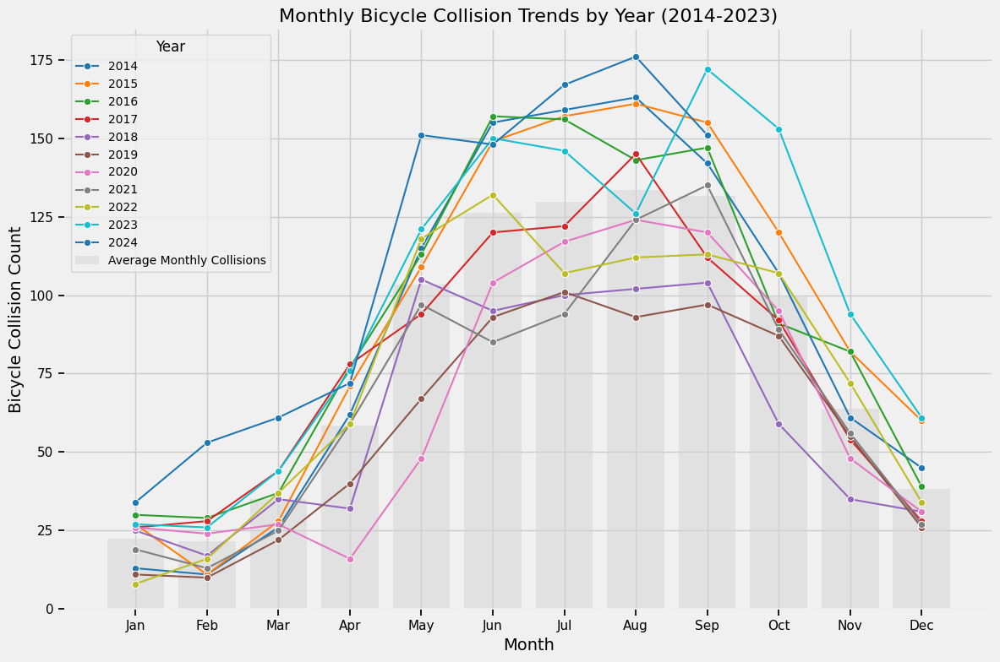

In [18]:
# Group data by Year and Month, and count collisions
monthly_collision_counts = collision_data_bicycles.groupby(['YEAR', 'MONTH']).size().reset_index(name='Bicycle_Collision_Count')

# Calculate the average monthly collision count across all years
average_monthly_collisions = monthly_collision_counts.groupby('MONTH')['Bicycle_Collision_Count'].mean().reset_index(name='Average_Collision_Count')

# Create a line plot with a custom color palette
plt.figure(figsize=(12, 8))

# Plot the bar plot for the average monthly collisions
plt.bar(average_monthly_collisions['MONTH'], average_monthly_collisions['Average_Collision_Count'], 
        color='lightgray', label='Average Monthly Collisions', alpha=0.5)

sns.lineplot(
    data=monthly_collision_counts,
    x='MONTH',
    y='Bicycle_Collision_Count',
    hue='YEAR',
    marker='o',
    palette='tab10'  
)

# Customize the plot
plt.title("Monthly Bicycle Collision Trends by Year (2014-2023)", fontsize=16)
plt.xlabel("Month", fontsize=14)
plt.ylabel("Bicycle Collision Count", fontsize=14)
plt.xticks(ticks=range(1, 13), labels=["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"])
plt.legend(title="Year", fontsize=10, title_fontsize=12)
plt.grid(True)

# Show the plot
plt.tight_layout()
plt.show()

#### Relationship between Day of the Week and Month

The following heatmap visualizes the number of bicycle collisions by day of the week and month from 2014 to 2023. The data is organized into a pivot table that cross-references the days of the week with each month of the year, providing a clear overview of collision patterns throughout the year. The heatmap uses color intensity to indicate the frequency of collisions, with darker colors representing higher collision counts. By including annotations on each cell, the heatmap allows for a detailed examination of collision trends across different days and months. This visualization helps to identify peak times for bicycle collisions, highlighting specific months or days of the week with higher accident rates, and can be useful for targeting safety interventions.

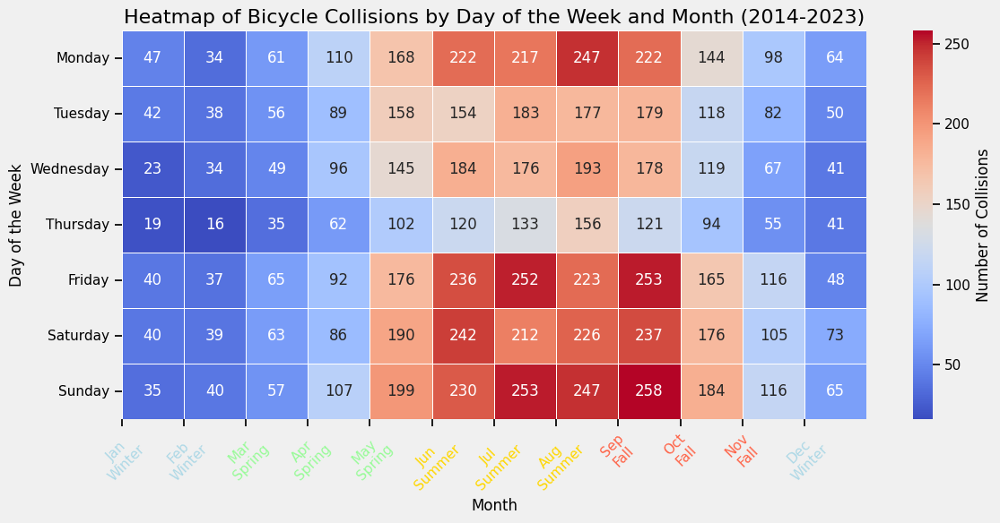

In [19]:
# Create a pivot table with counts of collisions by month and day of the week
collisions_pivot = collision_data_bicycles.pivot_table(index='DAY OF WEEK', columns='MONTH', aggfunc='size', fill_value=0)

# Reorder the days of the week to follow the traditional order
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
collisions_pivot.index = day_order

# Define months and their corresponding seasons
months = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
seasons = ["Winter", "Winter", "Spring", "Spring", "Spring", "Summer", "Summer", "Summer", "Fall", "Fall", "Fall", "Winter"]

# Set up color mapping for the seasons
season_colors = {
    "Winter": "#ADD8E6",  # Light blue for Winter
    "Spring": "#98FB98",  # Light green for Spring
    "Summer": "#FFD700",  # Gold for Summer
    "Fall": "#FF6347"     # Tomato red for Fall
}

# Create the heatmap
plt.figure(figsize=(12, 6))
sns.heatmap(collisions_pivot, annot=True, fmt='d', cmap='coolwarm', linewidths=0.5, cbar_kws={'label': 'Number of Collisions'})

# Add titles and labels
plt.title('Heatmap of Bicycle Collisions by Day of the Week and Month (2014-2023)', fontsize=16)
plt.xlabel('Month', fontsize=12)
plt.ylabel('Day of the Week', fontsize=12)

# Update x-axis to include both month and season
plt.xticks(ticks=range(12), labels=[f"{month}\n{season}" for month, season in zip(months, seasons)], rotation=45)

# Color-code the x-axis labels by season
for i, label in enumerate(plt.gca().get_xticklabels()):
    label.set_color(season_colors[seasons[i]])  # Color each label based on the season

# Adjust layout for better spacing
plt.tight_layout()

# Display the plot
plt.show()

### Relationship between Time of Day and Day of the Week 

The following line graph visualizes the relationship between the time of day and the number of bicycle collisions across the days of the week, based on data from 2014 to 2023. The time of day is categorized into four distinct periods: Morning (5 AM - 12 PM), Afternoon (12 PM - 5 PM), Evening (5 PM - 9 PM), and Night (9 PM - 5 AM). Each line represents the number of collisions during one of these time periods, plotted across the days of the week. The graph helps to identify patterns in collision frequency, highlighting the times of day that are most associated with bicycle accidents on different days. The legend is positioned outside the plot for better clarity, making it easy to differentiate between the time categories.

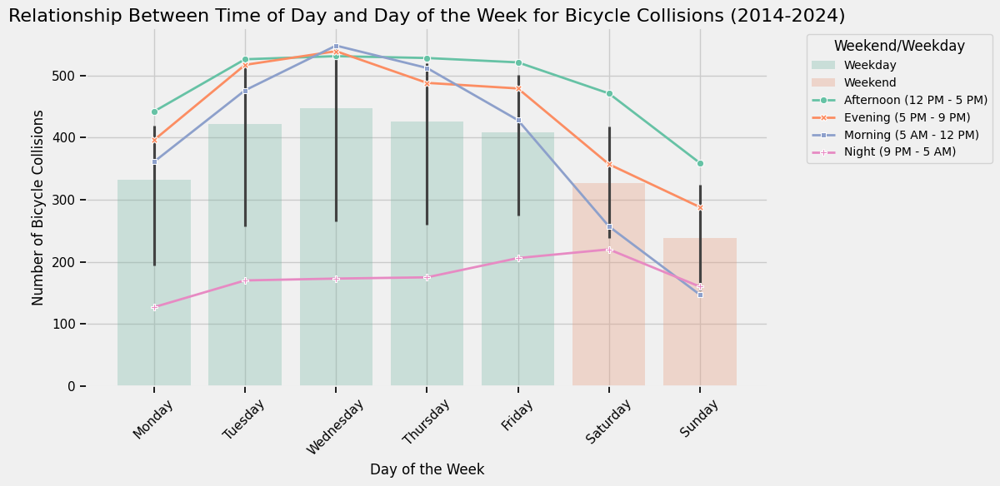

In [20]:
# Ensure 'HOUR' column is in integer format (if not already)
collision_data_bicycles['HOUR'] = collision_data_bicycles['HOUR'].astype(int)

# Define time categories based on the hour of the day
def categorize_time(hour):
    if 5 <= hour < 12:
        return 'Morning (5 AM - 12 PM)'
    elif 12 <= hour < 17:
        return 'Afternoon (12 PM - 5 PM)'
    elif 17 <= hour < 21:
        return 'Evening (5 PM - 9 PM)'
    else:
        return 'Night (9 PM - 5 AM)'

# Apply the time categorization to the 'HOUR' column
collision_data_bicycles['TIME OF DAY'] = collision_data_bicycles['HOUR'].apply(categorize_time)

# Group the data by 'Day Of Week' and 'TIME_OF_DAY' and count the collisions
collisions_by_day_time = collision_data_bicycles.groupby(['DAY OF WEEK', 'TIME OF DAY']).size().reset_index(name='Bicycle_Collision_Count')

# Reorder days of the week
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
collisions_by_day_time['DAY OF WEEK'] = pd.Categorical(collisions_by_day_time['DAY OF WEEK'], categories=day_order, ordered=True)

# Create a new column to identify weekdays (Monday to Friday) and weekends (Saturday and Sunday)
collisions_by_day_time['Weekend'] = collisions_by_day_time['DAY OF WEEK'].apply(lambda x: 'Weekend' if x in ['Saturday', 'Sunday'] else 'Weekday')

# Pivot data for line plot
collisions_pivot = collisions_by_day_time.pivot(index='DAY OF WEEK', columns='TIME OF DAY', values='Bicycle_Collision_Count')

# Plot the faint bars for weekday/weekend collisions
plt.figure(figsize=(12, 6))

# Plotting faint bars for weekdays and weekends
sns.barplot(data=collisions_by_day_time, x='DAY OF WEEK', y='Bicycle_Collision_Count', hue='Weekend', dodge=False, alpha=0.3)

# Overlay line plot for the time of day versus day of the week
sns.lineplot(data=collisions_pivot, markers=True, dashes=False, linewidth=2)

# Customize the plot
plt.title('Relationship Between Time of Day and Day of the Week for Bicycle Collisions (2014-2024)', fontsize=16)
plt.xlabel('Day of the Week', fontsize=12)
plt.ylabel('Number of Bicycle Collisions', fontsize=12)
plt.xticks(rotation=45)
plt.grid(True)

# Move the legend to the side (outside the plot area)
plt.legend(title='Weekend/Weekday', fontsize=10, title_fontsize=12, bbox_to_anchor=(1.05, 1), loc='upper left')

# Display the plot
plt.tight_layout()
plt.show()

## Import Ward Data

To begin analyzing the geographic distribution of bicycle collisions, we will import ward data for the City of Toronto. This dataset provides detailed information about the boundaries and identifiers of Toronto’s various wards, which will allow us to spatially map the collision data and analyze patterns specific to each ward. By integrating this data with our collision data, we can gain insights into how accidents are distributed across different areas of the city, helping to identify regions with higher collision rates and areas that may require targeted safety measures.

In [21]:
# Load the GeoJSON file generated (adjust the path if needed)
ward_data = gpd.read_file('../Clean Data/wards_data.geojson')  

# View geoDataFrame
ward_data.head()

,WARD NUMBER,WARD NAME,WARD DISTRICT,geometry
0,01,Etobicoke North,Etobicoke York,"POLYGON ((614361.910 4846443.252, 614376.274 4..."
1,02,Etobicoke Centre,Etobicoke York,"POLYGON ((618769.981 4839786.381, 618770.007 4..."
2,03,Etobicoke-Lakeshore,Etobicoke York,"POLYGON ((621184.054 4834315.989, 621213.577 4..."
3,04,Parkdale-High Park,Toronto and East York,"POLYGON ((623660.782 4836061.188, 623724.263 4..."
4,05,York South-Weston,Etobicoke York,"POLYGON ((623361.036 4840391.392, 623364.743 4..."



Since the ward data has already been cleaned and analyzed, we only need to import it and correlate it with the collision data.

## Overlay Collision Data onto Ward Data 

To better understand the spatial distribution of bicycle collisions across Toronto, we will overlay the collision data onto the ward data. This process will allow us to visualize how collisions are distributed within the city's various wards, helping to identify areas with higher accident rates. By mapping the collision data to the ward boundaries, we can analyze the relationship between specific locations and collision frequency, which can inform targeted interventions for improving cyclist safety in high-risk areas.


In [22]:
# Convert collision data to GeoDataFrame
collision_data_bicycles["geometry"] = collision_data_bicycles.apply(lambda row: Point(row["LONGITUDE"], row["LATITUDE"]), axis=1)
collision_data_bicycles = gpd.GeoDataFrame(collision_data_bicycles, geometry="geometry", crs="EPSG:4326")

In [23]:
# Create a folium map
map_wards = folium.Map(location=[43.7, -79.4], zoom_start=11)  # Adjust to center on Toronto

# Add the ward shapefile to the map
folium.GeoJson(ward_data, 
               name="Wards"
              ).add_to(map_wards)

# Define a color map for years (you can adjust the color palette as needed)
year_colors = {
  2014: 'cyan',
  2015: 'blue',
  2016: 'green',
  2017: 'red',
  2018: 'purple',
  2019: 'orange',
  2020: 'yellow',
  2021: 'pink',
  2022: 'black',
  2023: 'gray',
  2024: 'brown'
}


# Add each collision from collision_data_bicycles to the map
for _, row in collision_data_bicycles.iterrows():
    # Extract the year from the 'DATE' column
    year = pd.to_datetime(row['DATE']).year  # Convert 'DATE' to datetime and extract the year
    
    # Get the color corresponding to the year
    color = year_colors.get(year)  

    folium.CircleMarker(
      location=[row['LATITUDE'], row['LONGITUDE']],  # Set the marker's location
      radius=1,  # Marker size
      color=color,  # Border color based on the year
      fill=True,
      fill_color=color,  # Fill color based on the year
      fill_opacity=0.6  # Transparency
    ).add_to(map_wards)

# Add a layer control to toggle map layers if needed
folium.LayerControl().add_to(map_wards)

# Display the interactive map
map_wards

In [24]:
# Convert both to the same CRS (EPSG:4326)
ward_data = ward_data.to_crs(epsg=4326)
collision_data_bicycles = collision_data_bicycles.set_crs(epsg=4326, allow_override=True)

# Perform the spatial join to find which ward each collision occurred in
collision_with_wards = gpd.sjoin(collision_data_bicycles, ward_data, how="left", predicate="within")

# Drop unnecessary geometry columns for tabular display
collision_table = collision_with_wards.drop(columns=["geometry", "index_right"])

# Rename columns in the GeoDataFrame
collision_table.rename(columns={
    'AREA_TYPE': 'Ward_Number',           
    'AREA_NAME': 'Ward_Name'
}, inplace=True)

# Display the table in the notebook
collision_table.head()  # Display first few rows of the table

,DATE,HOUR,DAY OF WEEK,MONTH,YEAR,BICYCLE,LONGITUDE,LATITUDE,TIME OF DAY,WARD NUMBER,WARD NAME,WARD DISTRICT
89,2014-01-02,18,Thursday,1,2014,YES,-79.380272,43.648644,Evening (5 PM - 9 PM),13,Toronto Centre,Toronto and East York
351,2014-01-03,11,Friday,1,2014,YES,-79.399845,43.652539,Morning (5 AM - 12 PM),10,Spadina-Fort York,Toronto and East York
1857,2014-01-09,13,Thursday,1,2014,YES,-79.405167,43.656966,Afternoon (12 PM - 5 PM),11,University-Rosedale,Toronto and East York
1891,2014-01-09,5,Thursday,1,2014,YES,-79.480613,43.665578,Morning (5 AM - 12 PM),04,Parkdale-High Park,Toronto and East York
2271,2014-01-12,22,Sunday,1,2014,YES,-79.377892,43.649143,Night (9 PM - 5 AM),13,Toronto Centre,Toronto and East York


In [25]:
# Convert the DataFrame to a GeoDataFrame
geometry = [Point(xy) for xy in zip(collision_table['LONGITUDE'], collision_table['LATITUDE'])]
gdf = gpd.GeoDataFrame(collision_table, geometry=geometry)

# Export the GeoDataFrame to GeoJSON
output_path = "../Clean Data/collision_ward_data.geojson"
gdf.to_file(output_path, driver="GeoJSON")

## Exploratory Data Analysis with Bicyle Collision and Ward Data (2014 to 2024)



### Proportional Distribution of Bicycle Collisions by Ward District (2014-2024)

This pie chart visualizes the distribution of bicycle collisions across different ward districts over the past decade. Each slice represents the total number of collisions for a particular ward, with the size of each slice corresponding to the relative proportion of incidents. The chart allows for a quick comparison of collision frequencies by district, helping to highlight areas with a higher or lower prevalence of bicycle-related accidents. The color-coded wards provide clarity, and the percentage labels offer an easy-to-read breakdown of the collision data.

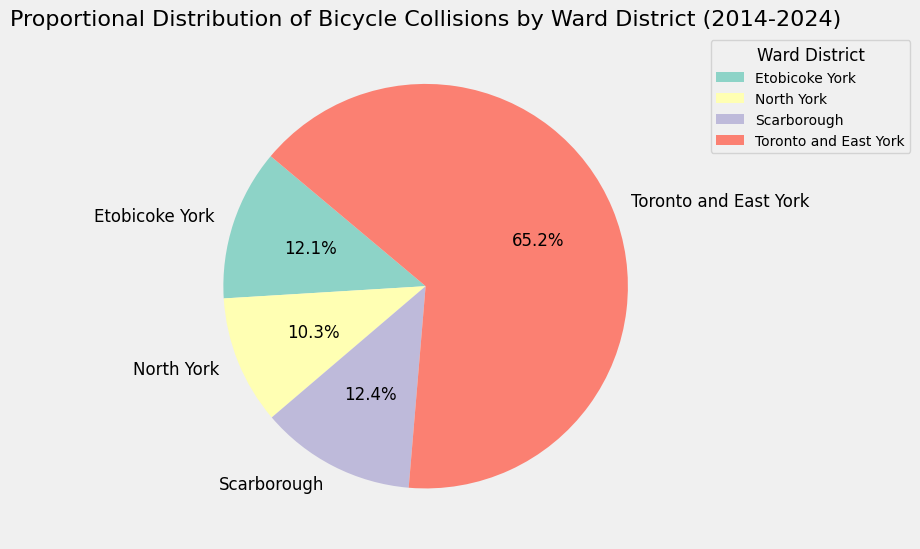

In [26]:
# Group by Ward District to get the total number of collisions across all years
collisions_by_ward = collision_table.groupby('WARD DISTRICT').size().reset_index(name='Number of Collisions')

# Set up a color palette to differentiate each ward
import seaborn as sns
palette = sns.color_palette("Set3", len(collisions_by_ward))

# Plotting the pie chart
plt.figure(figsize=(8, 8))
plt.pie(collisions_by_ward['Number of Collisions'], 
        labels=collisions_by_ward['WARD DISTRICT'], 
        autopct='%1.1f%%', 
        startangle=140, 
        colors=palette, 
        textprops={'fontsize': 12})

# Add title and ensure the aspect ratio is equal for a proper pie chart
plt.title('Proportional Distribution of Bicycle Collisions by Ward District (2014-2024)', fontsize=16)

# Add a legend for clarity (outside the pie chart)
plt.legend(collisions_by_ward['WARD DISTRICT'], title="Ward District", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)

# Show the plot
plt.tight_layout()
plt.show()

### Bicycle Collisions Across Wards from 2014 to 2024

The following line graph visualizes the total number of bicycle collisions across various wards in Toronto from 2014 to 2024. Each ward is represented by a distinct color, allowing for easy comparison of collision trends over time. The x-axis shows the years, while the y-axis represents the number of collisions recorded. By using unique colors for each ward, this graph highlights how collision frequencies fluctuate from year to year across different areas of the city, providing valuable insights into the spatial and temporal distribution of bicycle-related accidents.

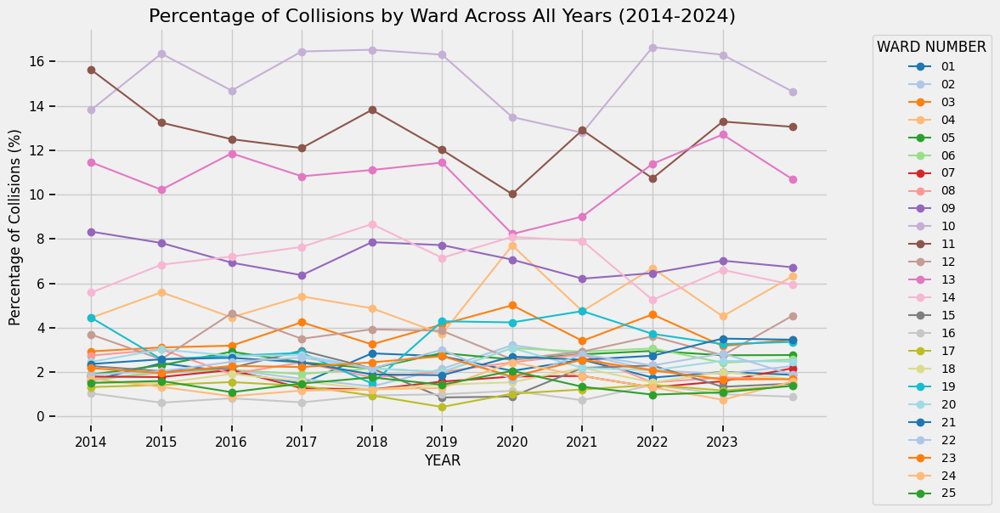

In [27]:
# Grouping by ward, ward name, and year for the total collision count across all years
ward_yearly_collisions = collision_table.groupby(["WARD NUMBER", "WARD NAME", "YEAR"]).size().reset_index(name="Collisions")

# Calculate total collisions for each year across all wards
total_collisions_per_year = ward_yearly_collisions.groupby('YEAR')['Collisions'].sum().reset_index(name='Total_Collisions')

# Merge the total collisions with the ward-level data to calculate percentage
ward_yearly_collisions = pd.merge(ward_yearly_collisions, total_collisions_per_year, on='YEAR')
ward_yearly_collisions['Percentage_of_Collisions'] = (ward_yearly_collisions['Collisions'] / ward_yearly_collisions['Total_Collisions']) * 100

# Generate a color palette for each ward (ensuring each ward gets a different color)
unique_colors = sns.color_palette("tab20", n_colors=len(ward_yearly_collisions['WARD NUMBER'].unique()))

# Plotting the line graph for percentage of collisions across all years (one line for each ward)
plt.figure(figsize=(12, 6))

# Loop through each unique ward and plot a line graph for percentage
for idx, ward in enumerate(ward_yearly_collisions['WARD NUMBER'].unique()):
    ward_data = ward_yearly_collisions[ward_yearly_collisions['WARD NUMBER'] == ward]
    plt.plot(ward_data['YEAR'], ward_data['Percentage_of_Collisions'], label=ward, color=unique_colors[idx], marker='o')

# Adding titles and labels
plt.title("Percentage of Collisions by Ward Across All Years (2014-2024)", fontsize=16)
plt.xlabel("YEAR", fontsize=12)
plt.ylabel("Percentage of Collisions (%)", fontsize=12)

# Customize x-ticks for year range
plt.xticks(range(2014, 2024))

# Add legend and grid
plt.legend(title="WARD NUMBER", bbox_to_anchor=(1.05, 1), loc="upper left", fontsize=10)
plt.grid(True)

# Adjust layout for better spacing
plt.tight_layout()

# Display the plot
plt.show()

### Bicycle Collisions Across Ward Districts from 2014 to 2024

This line graph illustrates the percentage of total bicycle collisions occurring in each ward district over the span of a decade, from 2014 to 2024. The data has been grouped by year and ward district, with the percentage of collisions for each ward shown annually. Each line represents a different ward, allowing for easy comparison of trends in collision frequency across different years. This plot provides insights into whether certain districts have seen an increase or decrease in bicycle collisions relative to the total number of incidents each year.

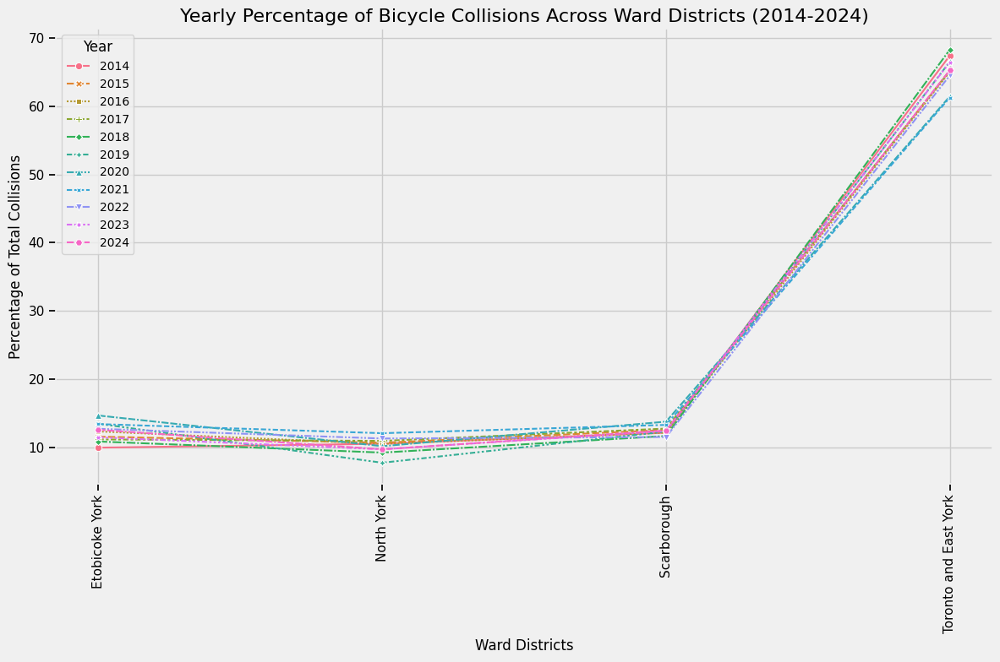

In [28]:
# Group the data by YEAR and WARD DISTRICT, then count the number of collisions per ward per year
collisions_per_year_per_ward = collision_with_wards.groupby(['YEAR', 'WARD DISTRICT']).size().reset_index(name='Collision_Count')

# Calculate the total collisions per year
total_collisions_per_year = collisions_per_year_per_ward.groupby('YEAR')['Collision_Count'].sum().reset_index(name='Total_Collisions')

# Merge the total collisions with the individual ward collision data to calculate percentages
collisions_per_year_per_ward = pd.merge(collisions_per_year_per_ward, total_collisions_per_year, on='YEAR')
collisions_per_year_per_ward['Collision_Percentage'] = (
    collisions_per_year_per_ward['Collision_Count'] / collisions_per_year_per_ward['Total_Collisions'] * 100
)

# Pivot the data so that each row corresponds to a ward and each column corresponds to a year
collisions_pivot = collisions_per_year_per_ward.pivot(index='WARD DISTRICT', columns='YEAR', values='Collision_Percentage')

# Plot the data using Seaborn/Matplotlib
plt.figure(figsize=(12, 8))
sns.lineplot(data=collisions_pivot, markers=True)

# Customize the plot
plt.title('Yearly Percentage of Bicycle Collisions Across Ward Districts (2014-2024)', fontsize=16)
plt.xlabel('Ward Districts', fontsize=12)
plt.ylabel('Percentage of Total Collisions', fontsize=12)
plt.xticks(rotation=90)
plt.legend(title='Year', fontsize=10, title_fontsize=12)
plt.grid(True)

# Display the plot
plt.tight_layout()
plt.show()


### Collisions across all Wards every month from 2014 to 2024

This line graph showcases the percentage of total bicycle collisions that occurred in each ward district throughout the months of the year, from 2014 to 2024. The data is visualized as a separate line for each ward, with the x-axis representing the months of the year (January to December) and the y-axis showing the percentage of the total collisions. This allows for comparison of collision trends across wards on a month-by-month basis, providing insights into which months tend to have higher collision rates in specific wards. The plot helps identify seasonal patterns and variations in collision occurrences by ward, allowing for targeted interventions during peak months.

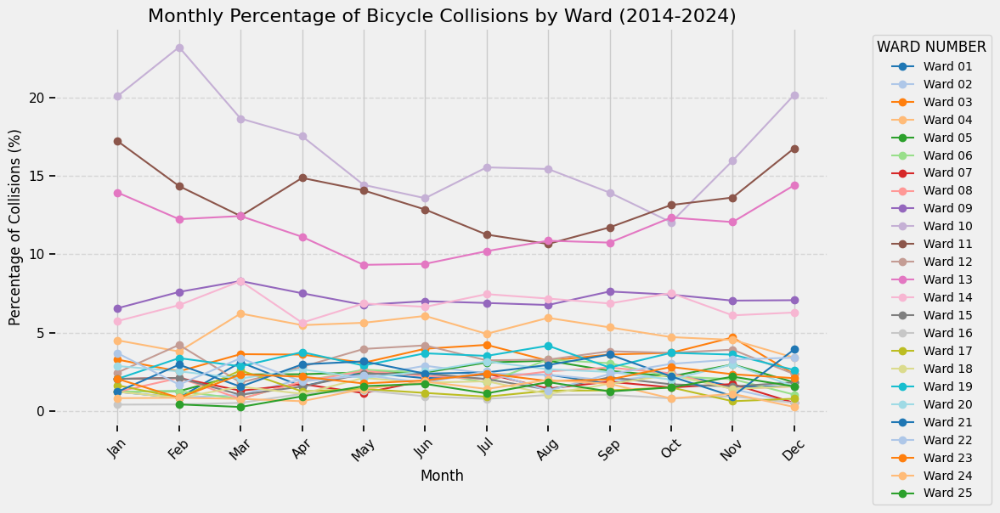

In [29]:
# Group by Ward Number and Month to get the total number of collisions across all years
monthly_collisions_by_ward = collision_table.groupby(['WARD NUMBER', 'MONTH']).size().reset_index(name='Number of Collisions')

# Calculate the total number of collisions for each month across all wards
total_collisions_per_month = monthly_collisions_by_ward.groupby('MONTH')['Number of Collisions'].sum().reset_index(name='Total Collisions')

# Merge the total collisions with the monthly ward-level data to calculate the percentage of collisions for each ward
monthly_collisions_by_ward = pd.merge(monthly_collisions_by_ward, total_collisions_per_month, on='MONTH', how='left')

# Calculate the percentage of collisions for each ward per month
monthly_collisions_by_ward['Percentage_of_Collisions'] = (monthly_collisions_by_ward['Number of Collisions'] / monthly_collisions_by_ward['Total Collisions']) * 100

# Handle missing values (if any NaN values exist, fill them with 0 or appropriate values)
monthly_collisions_by_ward['Percentage_of_Collisions'].fillna(0, inplace=True)

# Define months for the x-axis
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

# Set up a color palette with different colors for each ward
ward_numbers = monthly_collisions_by_ward['WARD NUMBER'].unique()
palette = sns.color_palette("tab20", len(ward_numbers))

# Plotting the line graph for percentage of collisions for each ward
plt.figure(figsize=(12, 6))

for i, ward in enumerate(ward_numbers):
    # Filter the data for each ward
    ward_data = monthly_collisions_by_ward[monthly_collisions_by_ward['WARD NUMBER'] == ward]
    
    # Plot the data for each ward
    plt.plot(ward_data['MONTH'], ward_data['Percentage_of_Collisions'], marker='o', label=f'Ward {ward}', color=palette[i])

# Customize the plot
plt.title('Monthly Percentage of Bicycle Collisions by Ward (2014-2024)', fontsize=16)
plt.xlabel('Month', fontsize=12)
plt.ylabel('Percentage of Collisions (%)', fontsize=12)
plt.xticks(ticks=range(12), labels=months, rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Adjust x-tick positions by shifting one tick to the right
plt.xticks(ticks=range(1, 13), labels=months, rotation=45)  

# Add a legend to differentiate each ward
plt.legend(title="WARD NUMBER", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)

# Adjust layout for better spacing
plt.tight_layout()

# Display the plot
plt.show()


### ### Collisions across all Wards every month from 2014 to 2024

This combined bar and line graph visualizes the percentage of bicycle collisions that occurred in each ward district on a monthly basis, spanning from 2014 to 2024. The bar plot shows the proportion of collisions for each ward district per month, with a separate color for each ward. The overlaid line graph provides a clearer trend of these percentages over time. This dual-visual approach helps in comparing monthly collision patterns across different wards, highlighting variations in collision rates by month and ward district. The plot is useful for understanding seasonal trends and identifying which months have higher collision rates in specific wards, aiding in targeted safety initiatives.

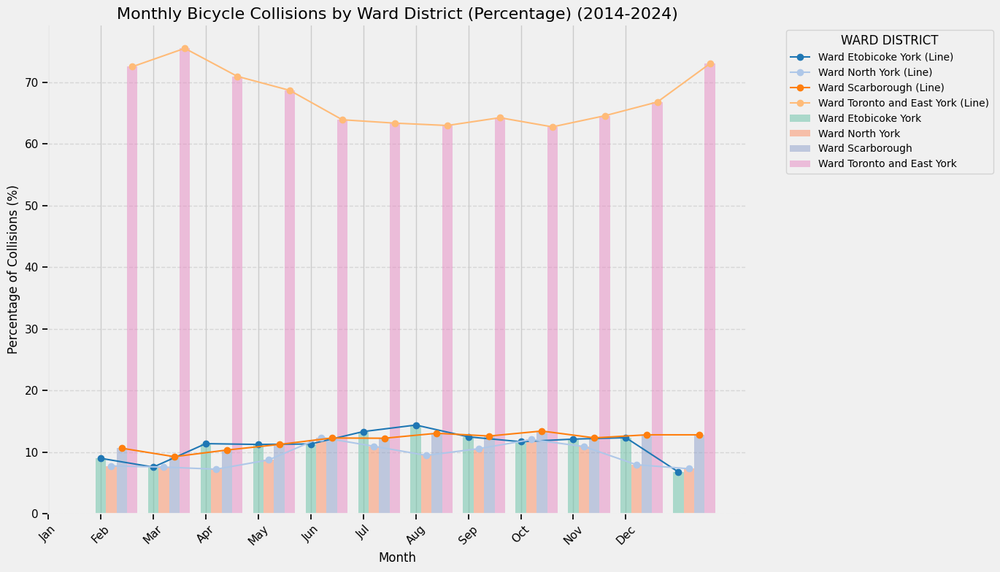

In [30]:
# Group by Ward District and Month to get the total number of collisions across all years
monthly_collisions_by_ward = collision_table.groupby(['WARD DISTRICT', 'MONTH']).size().reset_index(name='Number of Collisions')

# Calculate the total number of collisions for each month across all wards
total_collisions_per_month = monthly_collisions_by_ward.groupby('MONTH')['Number of Collisions'].sum().reset_index(name='Total_Collisions')

# Merge the total collisions with the monthly ward-level data to calculate percentage
monthly_collisions_by_ward = pd.merge(monthly_collisions_by_ward, total_collisions_per_month, on='MONTH')
monthly_collisions_by_ward['Percentage_of_Collisions'] = (monthly_collisions_by_ward['Number of Collisions'] / monthly_collisions_by_ward['Total_Collisions']) * 100

# Define months for the x-axis
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

# Set up a color palette with different colors for each ward district
ward_numbers = monthly_collisions_by_ward['WARD DISTRICT'].unique()
palette = sns.color_palette("tab20", len(ward_numbers))

# Plotting the figure
plt.figure(figsize=(14, 8))

# Plot bars for percentage of collisions for each ward district
for i, ward in enumerate(ward_numbers):
    ward_data = monthly_collisions_by_ward[monthly_collisions_by_ward['WARD DISTRICT'] == ward]
    
    # Bars: Shift the positions by 0.2 for each ward to avoid overlap
    plt.bar(ward_data['MONTH'] + i * 0.2, ward_data['Percentage_of_Collisions'], 
            width=0.2, label=f'Ward {ward}', alpha=0.5)

# Plotting the line graph for percentage of collisions for each ward
for i, ward in enumerate(ward_numbers):
    ward_data = monthly_collisions_by_ward[monthly_collisions_by_ward['WARD DISTRICT'] == ward]
    plt.plot(ward_data['MONTH'] + i * 0.2, ward_data['Percentage_of_Collisions'], 
             marker='o', color=palette[i], label=f'Ward {ward} (Line)')

# Customize the plot
plt.title('Monthly Bicycle Collisions by Ward District (Percentage) (2014-2024)', fontsize=16)
plt.xlabel('Month', fontsize=12)
plt.ylabel('Percentage of Collisions (%)', fontsize=12)
plt.xticks(ticks=range(12), labels=months, rotation=45)  
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add a legend to differentiate each ward
plt.legend(title="WARD DISTRICT", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)

# Adjust layout for better spacing
plt.tight_layout()

# Display the plot
plt.show()

### Collisions Across all Wards Day of the Week


This line graph illustrates the percentage distribution of bicycle collisions by day of the week for each ward, covering the years 2014 to 2024. Each line represents a specific ward number, showing how the collision percentage varies from Monday to Sunday. The x-axis categorizes the days of the week in chronological order, while the y-axis represents the percentage of total collisions occurring in each ward on a given day. This visualization helps identify patterns, such as whether certain wards experience more incidents on weekdays versus weekends, offering insights into weekly collision trends and ward-specific safety challenges.

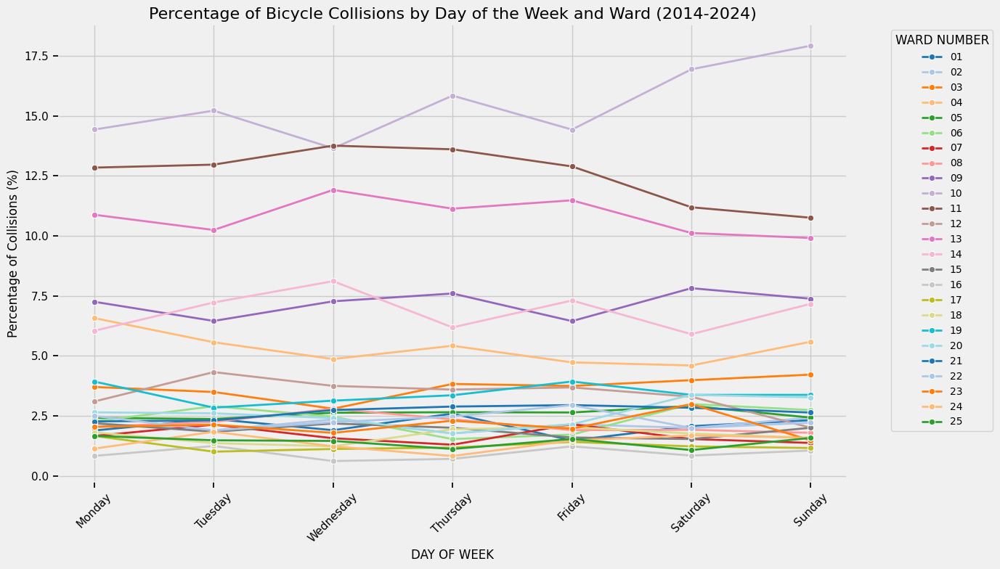

In [31]:
# Group by Ward Number and Day of Week to get the total number of collisions for each day in each ward
collisions_by_day_ward = collision_table.groupby(['DAY OF WEEK', 'WARD NUMBER']).size().reset_index(name='Number of Collisions')

# Calculate the total number of collisions for each day of the week across all wards
total_collisions_per_day = collisions_by_day_ward.groupby('DAY OF WEEK')['Number of Collisions'].sum().reset_index(name='Total_Collisions')

# Merge the total collisions with the ward-level data to calculate percentage
collisions_by_day_ward = pd.merge(collisions_by_day_ward, total_collisions_per_day, on='DAY OF WEEK')
collisions_by_day_ward['Percentage_of_Collisions'] = (collisions_by_day_ward['Number of Collisions'] / collisions_by_day_ward['Total_Collisions']) * 100

# Define the order of the days of the week
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Reorder the Day of Week column
collisions_by_day_ward['DAY OF WEEK'] = pd.Categorical(collisions_by_day_ward['DAY OF WEEK'], categories=day_order, ordered=True)
collisions_by_day_ward = collisions_by_day_ward.sort_values(['DAY OF WEEK', 'WARD NUMBER'])

# Set up the plot
plt.figure(figsize=(14, 8))

# Plotting the line graph for percentage of collisions for each ward, with each line representing a ward number
sns.lineplot(data=collisions_by_day_ward, 
             x='DAY OF WEEK', 
             y='Percentage_of_Collisions', 
             hue='WARD NUMBER', 
             marker='o', 
             palette='tab20', 
             linewidth=2)

# Customize the plot
plt.title('Percentage of Bicycle Collisions by Day of the Week and Ward (2014-2024)', fontsize=16)
plt.xlabel('DAY OF WEEK', fontsize=12)
plt.ylabel('Percentage of Collisions (%)', fontsize=12)
plt.xticks(rotation=45)
plt.legend(title='WARD NUMBER', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
plt.grid(True)

# Show the plot
plt.tight_layout()
plt.show()

### Collisions Across all Ward Districts Day of the Week

This visualization shows the percentage of bicycle collisions by day of the week across different ward districts from 2014 to 2024. The chart combines both bar and line graphs to display the collision percentages for each ward on each day, with bars representing the proportion of collisions in each ward for each day of the week and lines connecting the data points for a smoother trend comparison. The x-axis reflects the days of the week (Monday to Sunday), while the y-axis shows the percentage of total collisions for each ward on those days. This plot helps identify patterns in collision frequency, such as whether certain days of the week, like weekends, see higher collision rates in specific wards.

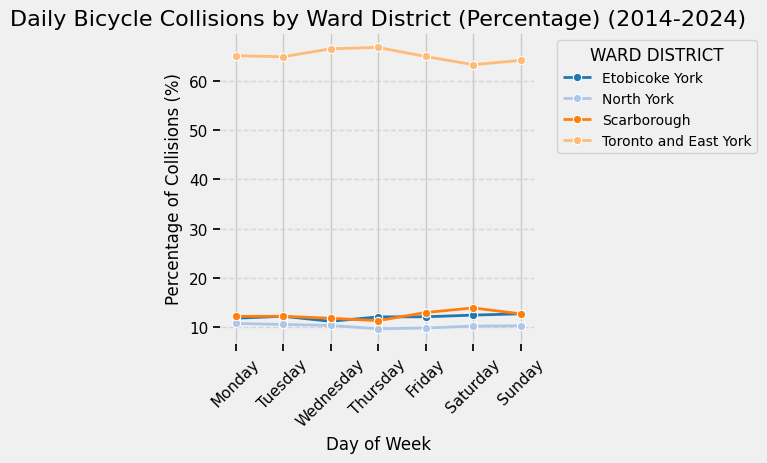

In [32]:
# Group by Ward District and Day of the Week to get the total number of collisions across all years
daily_collisions_by_ward = collision_table.groupby(['WARD DISTRICT', 'DAY OF WEEK']).size().reset_index(name='Number of Collisions')

# Calculate the total number of collisions for each day of the week across all wards
total_collisions_per_day = daily_collisions_by_ward.groupby('DAY OF WEEK')['Number of Collisions'].sum().reset_index(name='Total_Collisions')

# Merge the total collisions with the daily ward-level data to calculate percentage
daily_collisions_by_ward = pd.merge(daily_collisions_by_ward, total_collisions_per_day, on='DAY OF WEEK')
daily_collisions_by_ward['Percentage_of_Collisions'] = (daily_collisions_by_ward['Number of Collisions'] / daily_collisions_by_ward['Total_Collisions']) * 100

# Define the order of the days of the week (you can map these to numbers for plotting)
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
day_to_num = {day: i for i, day in enumerate(day_order)}

# Convert 'DAY OF WEEK' from string to numeric value for proper plotting
daily_collisions_by_ward['Day_num'] = daily_collisions_by_ward['DAY OF WEEK'].map(day_to_num)

# Set up a color palette with different colors for each ward district
ward_numbers = daily_collisions_by_ward['WARD DISTRICT'].unique()
palette = sns.color_palette("tab20", len(ward_numbers))

# Plotting the line graph for percentage of collisions for each ward, aligned with the bars
sns.lineplot(data=daily_collisions_by_ward, 
             x='Day_num', 
             y='Percentage_of_Collisions', 
             hue='WARD DISTRICT', 
             marker='o', 
             palette='tab20', 
             linewidth=2)

# Customize the plot
plt.title('Daily Bicycle Collisions by Ward District (Percentage) (2014-2024)', fontsize=16)
plt.xlabel('Day of Week', fontsize=12)
plt.ylabel('Percentage of Collisions (%)', fontsize=12)
plt.xticks(ticks=range(7), labels=day_order, rotation=45)  # Use the day_order for x-tick labels
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add a legend to differentiate each ward
plt.legend(title="WARD DISTRICT", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)

# Adjust layout for better spacing
plt.tight_layout()

# Display the plot
plt.show()



### Collisions across all Ward for Time of Day


This plot visualizes the percentage of bicycle collisions across different wards, segmented by time of day, from 2014 to 2023. The data is grouped into four time categories: Morning (5 AM - 12 PM), Afternoon (12 PM - 5 PM), Evening (5 PM - 9 PM), and Night (9 PM - 5 AM). The line graph displays the proportion of collisions occurring within each time category for each ward, allowing for a clear comparison of collision trends over the course of the day across various wards. This analysis provides insights into peak collision times and helps identify potential patterns of heightened risk during specific hours for different areas.

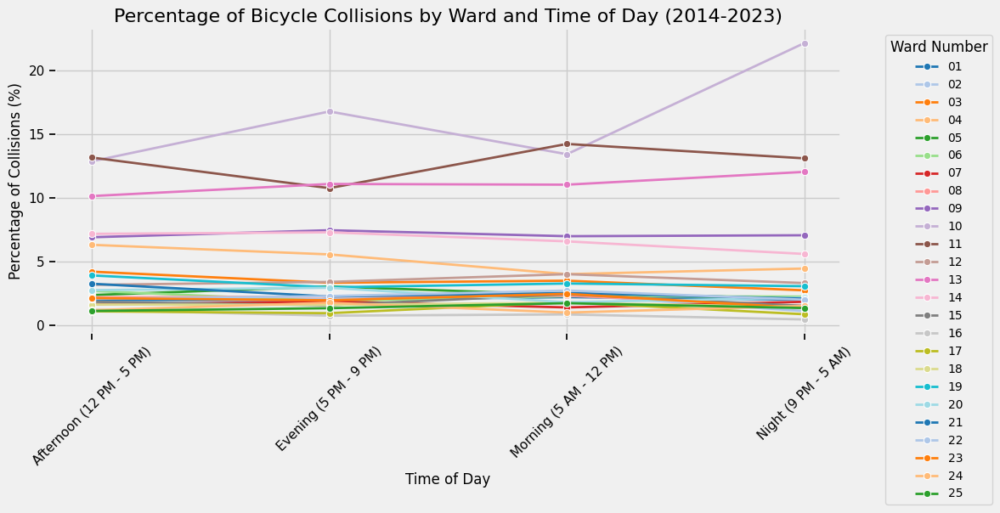

In [33]:
# Group by Ward Number and Time of Day to get the total number of collisions
collisions_by_ward_time = collision_table.groupby(['WARD NUMBER', 'TIME OF DAY']).size().reset_index(name='Number of Collisions')

# Calculate the total number of collisions for each time of day across all wards
total_collisions_per_time_of_day = collisions_by_ward_time.groupby('TIME OF DAY')['Number of Collisions'].sum().reset_index(name='Total_Collisions')

# Merge the total collisions with the ward-level data to calculate percentage
collisions_by_ward_time = pd.merge(collisions_by_ward_time, total_collisions_per_time_of_day, on='TIME OF DAY')
collisions_by_ward_time['Percentage_of_Collisions'] = (collisions_by_ward_time['Number of Collisions'] / collisions_by_ward_time['Total_Collisions']) * 100

# Define the time categories for the x-axis
time_of_day_order = ['Morning (5 AM - 12 PM)', 'Afternoon (12 PM - 5 PM)', 'Evening (5 PM - 9 PM)', 'Night (9 PM - 5 AM)']

# Set up the plot
plt.figure(figsize=(12, 6))

# Plotting the line graph for percentage of collisions for each ward, with each line representing a ward number
sns.lineplot(data=collisions_by_ward_time, 
             x='TIME OF DAY', 
             y='Percentage_of_Collisions', 
             hue='WARD NUMBER', 
             marker='o', 
             palette='tab20', 
             linewidth=2)

# Customize the plot
plt.title('Percentage of Bicycle Collisions by Ward and Time of Day (2014-2024)', fontsize=16)
plt.xlabel('Time of Day', fontsize=12)
plt.ylabel('Percentage of Collisions (%)', fontsize=12)
plt.xticks(rotation=45)
plt.legend(title='Ward Number', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
plt.grid(True)

# Show the plot
plt.tight_layout()
plt.show()

### Collisions across all Ward Districts for Time of Day

This plot displays the percentage of bicycle collisions across various ward districts, categorized by different times of day, from 2014 to 2024. The time of day is broken down into four intervals: Morning (5 AM - 12 PM), Afternoon (12 PM - 5 PM), Evening (5 PM - 9 PM), and Night (9 PM - 5 AM). The data is visualized through a combination of bar and line graphs, where the bars represent the percentage of collisions in each time period for each ward, and the lines provide a clearer view of the trends across wards. This analysis helps to highlight specific times of the day when collisions are more frequent in different areas, providing valuable insights for traffic safety and urban planning initiatives.

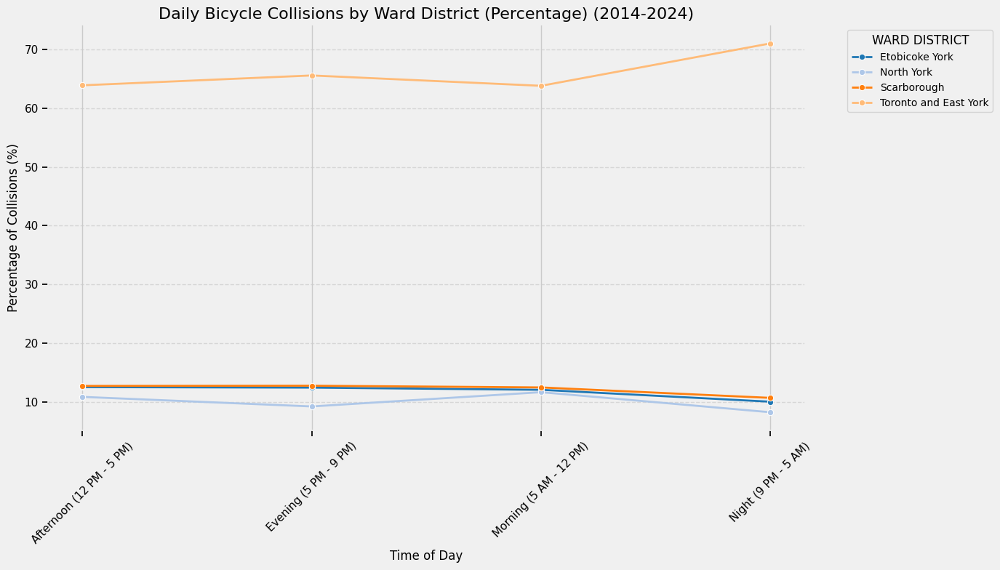

In [34]:
# Group by Ward District and Time of Day to get the total number of collisions across all years
collisions_by_ward_time = collision_table.groupby(['WARD DISTRICT', 'TIME OF DAY']).size().reset_index(name='Number of Collisions')

# Calculate the total number of collisions for each time of the day across all wards
total_collisions_per_time = collisions_by_ward_time.groupby('TIME OF DAY')['Number of Collisions'].sum().reset_index(name='Total_Collisions')

# Merge the total collisions with the time of day ward-level data to calculate percentage
collisions_by_ward_time = pd.merge(collisions_by_ward_time, total_collisions_per_time, on='TIME OF DAY')
collisions_by_ward_time['Percentage_of_Collisions'] = (collisions_by_ward_time['Number of Collisions'] / collisions_by_ward_time['Total_Collisions']) * 100

# Convert 'TIME OF DAY' to numeric values (e.g., map time intervals or categorical values to numbers)
# If 'TIME OF DAY' is categorical, you can map it to a numerical index or ensure it is treated as a string for categories
# Example of mapping categorical 'TIME OF DAY' to numbers (you can adjust this based on your dataset's structure):
time_of_day_to_num = {time: i for i, time in enumerate(collisions_by_ward_time['TIME OF DAY'].unique())}
collisions_by_ward_time['Time_num'] = collisions_by_ward_time['TIME OF DAY'].map(time_of_day_to_num)

# Set up a color palette with different colors for each ward district
ward_numbers = collisions_by_ward_time['WARD DISTRICT'].unique()
palette = sns.color_palette("tab20", len(ward_numbers))

# Plotting the figure
plt.figure(figsize=(14, 8))

# Plotting the line graph for percentage of collisions for each ward, aligned with the bars
sns.lineplot(data=collisions_by_ward_time, 
             x='Time_num', 
             y='Percentage_of_Collisions', 
             hue='WARD DISTRICT', 
             marker='o', 
             palette='tab20', 
             linewidth=2)

# Customize the plot
plt.title('Daily Bicycle Collisions by Ward District (Percentage) (2014-2024)', fontsize=16)
plt.xlabel('Time of Day', fontsize=12)
plt.ylabel('Percentage of Collisions (%)', fontsize=12)

# Use the same labels for x-axis ticks based on the time of day
plt.xticks(ticks=range(len(time_of_day_to_num)), labels=list(time_of_day_to_num.keys()), rotation=45)  # Use mapped time labels
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add a legend to differentiate each ward
plt.legend(title="WARD DISTRICT", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)

# Adjust layout for better spacing
plt.tight_layout()

# Display the plot
plt.show()
